In [1]:
import matplotlib.pyplot as plt, numpy as np

In [2]:
COMPLETE_PATH = '../data/O16/occluded/train_complete.npy'
OCCLUDED_PATH = '../data/O16/occluded/train_occluded.npy'

In [3]:
complete_clouds = np.load(COMPLETE_PATH, mmap_mode='r')
occluded_clouds = np.load(OCCLUDED_PATH, mmap_mode='r')
print(str(complete_clouds.shape[0]) + ' complete clouds, each with ' + str(complete_clouds.shape[1]) + ' points.')
print(str(occluded_clouds.shape[1]) + ' occlusions per complete cloud, each with ' + str(occluded_clouds.shape[2]) + ' points.')

2870 complete clouds, each with 512 points.
10 occlusions per complete cloud, each with 512 points.


In [13]:
def scalePointCloud(points):
    points[:,0] = points[:,0] * 250
    points[:,1] = points[:,1] * 250
    points[:,2] = (points[:,2] + 1) * 500
    return points

In [18]:
def comparePointClouds(complete, occluded):
    fig = plt.figure()
    ax_1 = fig.add_subplot(1, 2, 1, projection='3d')
    ax_2 = fig.add_subplot(1, 2, 2, projection='3d')
    new_complete = scalePointCloud(complete)
    new_occluded = scalePointCloud(occluded)
    for axis in [ax_1, ax_2]:
        axis.axes.set_xlim3d(left=-250, right=250)
        axis.axes.set_ylim3d(bottom=0, top=1000)
        axis.axes.set_zlim3d(bottom=-250, top=250)
        axis.set_xlabel('X')
        axis.set_ylabel('Z')
        axis.set_zlabel('Y')
        axis.zaxis.labelpad = 0
    ax_1.set_title('Complete')
    ax_1.scatter(complete[:,0], complete[:,2], complete[:,1], s=2)
    ax_2.set_title('Occluded')
    ax_2.scatter(occluded[:,0], occluded[:,2], occluded[:,1],s=2)
    plt.tight_layout(rect=[0, 0, 2, 1])
    plt.show()

In [21]:
EXAMPLES = 100

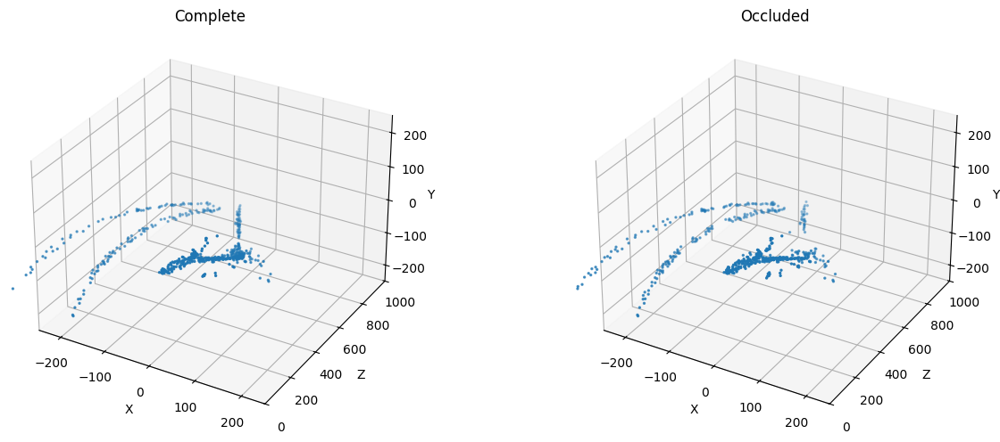

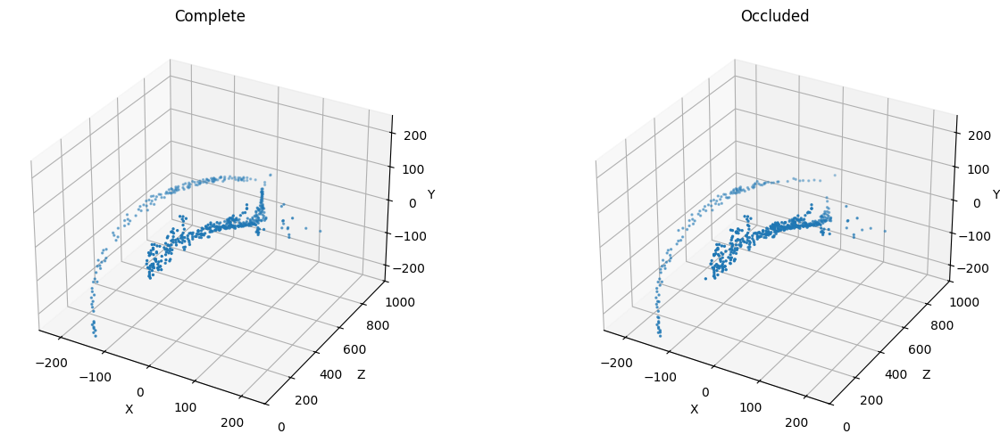

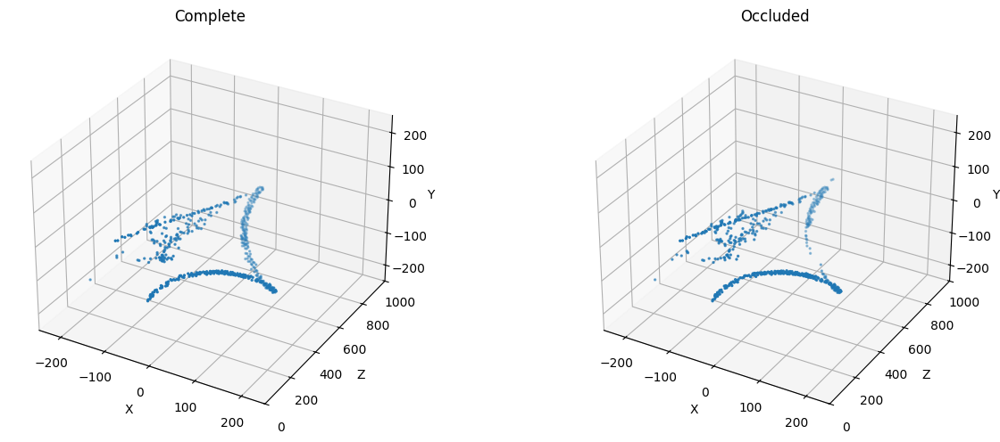

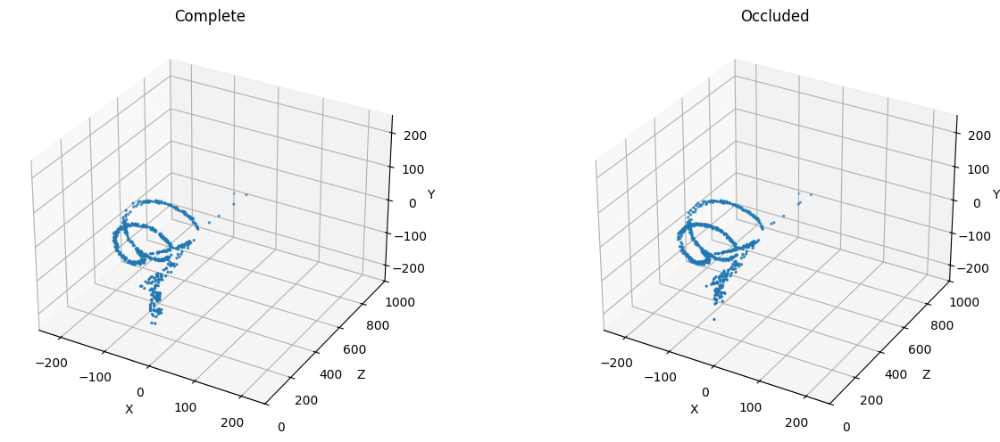

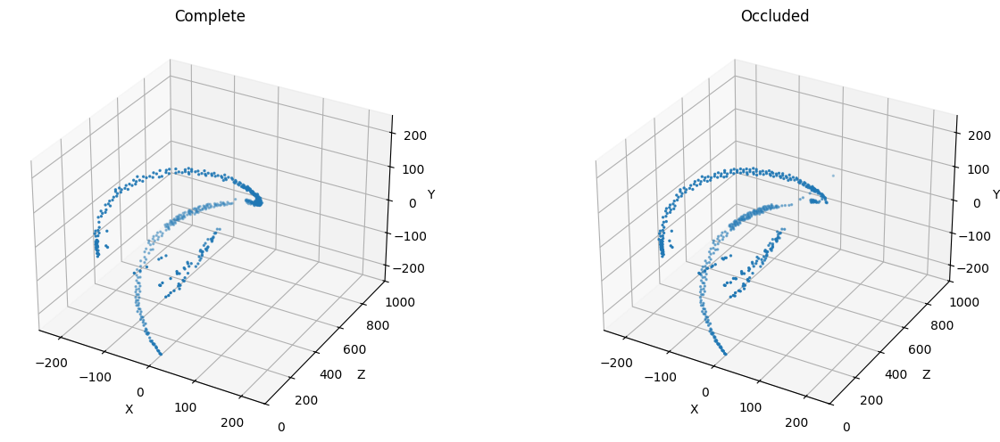

...

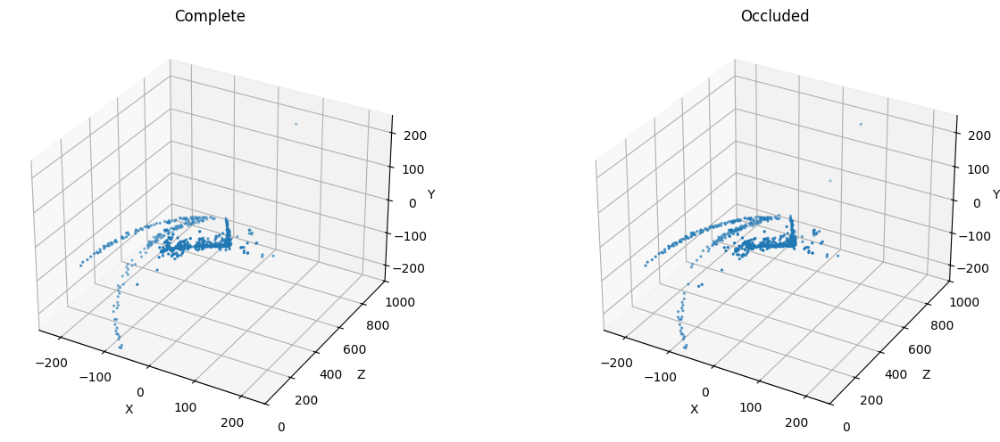

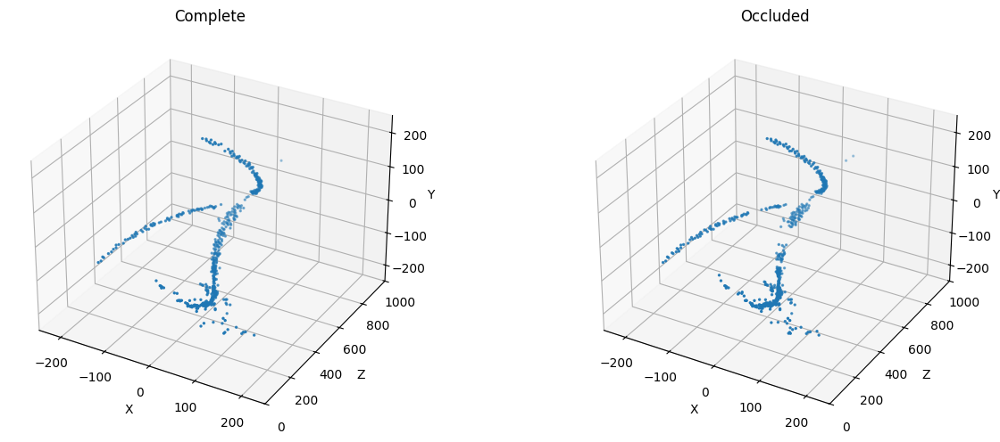

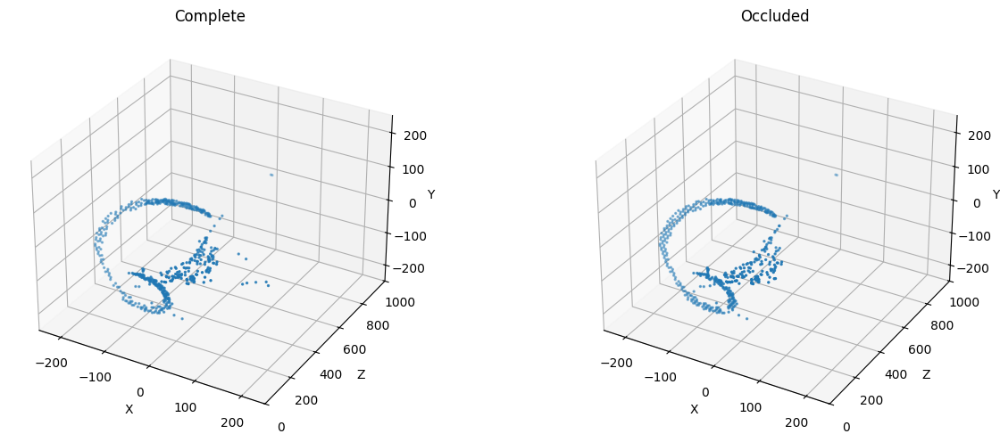

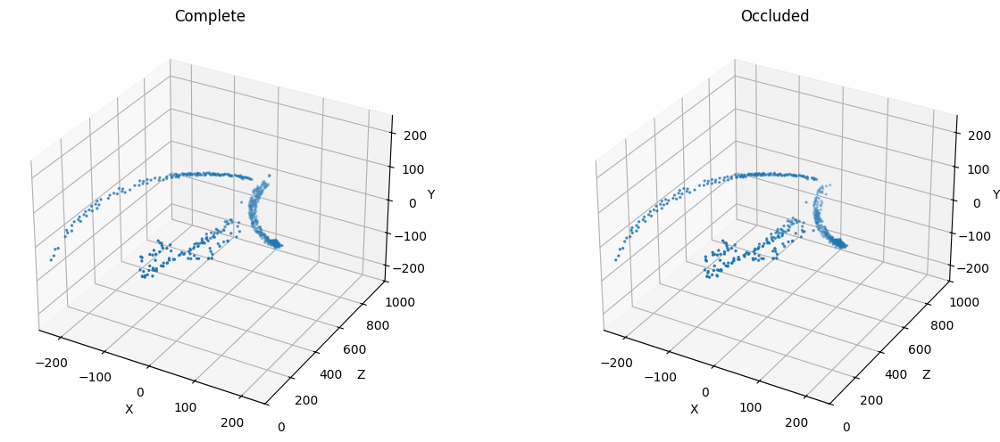

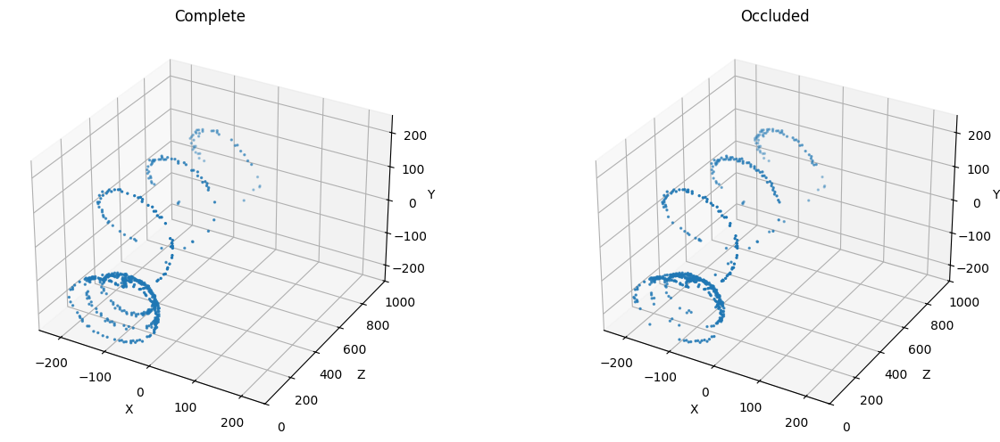

In [23]:
for i in range(EXAMPLES):
    index = np.random.randint(complete_clouds.shape[0])
    snapshot = np.random.randint(occluded_clouds.shape[1])
    complete_points = np.copy(complete_clouds[index])
    occluded_points = np.copy(occluded_clouds[index][snapshot])
    comparePointClouds(complete_points, occluded_points)